# Etapa 5: Composição e Blending


## Importações

In [1]:
import os
import glob
import json
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import List, Tuple

## Funções Auxiliares

In [2]:
def carregar_homogr_npz(caminho_npz):
    """
    Lê homogr_*.npz e retorna:
      H (3x3 float32), mask (Nx1 uint8), meta (dict: inliers, total, rmse_px, direction, params_json, idx_i, idx_j, path_i, path_j)
    """
    with np.load(caminho_npz, allow_pickle=True) as d:
        H = d["H"].astype(np.float32)
        mask = d["mask"].astype(np.uint8)
        meta = {
            "inliers": int(d["inliers"]),
            "total": int(d["total"]),
            "rmse_px": None if np.isnan(d["rmse_px"]) else float(d["rmse_px"]),
            "direction": str(d["direction"]),
            "params_json": str(d["params_json"]),
            "idx_i": int(d["idx_i"]), "idx_j": int(d["idx_j"]),
            "path_i": str(d["path_i"]), "path_j": str(d["path_j"]),
        }
    return H, mask, meta


def homografia_acumulada(homografias, n_imgs, idx_referencia: int | None = None):
    """
    homografias: matrizes de homografia para pares de imagem na ordem em que serão utilizadas no 
     ajuste do panorama. (Exemplo: homografia_000_001, homografia_001_002, homografia_002_003...)

    OBS: Calcular a homografia a partir do índice central ajuda a propagar menos o erro. 

    """
    if not idx_referencia:
        idx_referencia = n_imgs // 2

    H_acumulado = [None] * n_imgs 
    H_acumulado[idx_referencia] = np.identity(3) 

    # Homografia acumulada: índice de referência --> direita
    for i in range(idx_referencia + 1, n_imgs):
        H_par = homografias.get((i - 1, i)) # H de i para i-1

        if H_par is not None and H_acumulado[i-1] is not None:
            H_acumulado[i] = H_acumulado[i - 1] @ H_par
        else:
            break 

    # índice de referência --> esquerda
    for i in range(idx_referencia - 1, -1, -1):
        H_par = homografias.get((i, i + 1)) # H de i+1 para i
        if H_par is not None and H_acumulado[i+1] is not None and np.linalg.det(H_par) != 0:
            H_inv = np.linalg.inv(H_par)
            H_acumulado[i] = H_acumulado[i + 1] @ H_inv
        else:
            break
    return H_acumulado


def calcula_tamanho_panorama(caminho_ordem_imagens, H_acumulado):
    """
    """
    pontos_cantos_globais = []
    for i, caminho_img in enumerate(caminho_ordem_imagens):
        if H_acumulado[i] is not None:
            img = cv2.imread(caminho_img)
            if img is None: continue

            h, w = img.shape[:2]
            cantos = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)
            cantos_transformados = cv2.perspectiveTransform(cantos, H_acumulado[i])
            pontos_cantos_globais.append(cantos_transformados)

    todos_os_cantos = np.concatenate(pontos_cantos_globais, axis=0)
    xmin, ymin = np.floor(todos_os_cantos.min(axis=0).ravel()).astype(int)
    xmax, ymax = np.ceil(todos_os_cantos.max(axis=0).ravel()).astype(int)

    largura_panorama = xmax - xmin + 1
    altura_panorama = ymax - ymin + 1
    
    return (largura_panorama, altura_panorama, xmin, ymin)
    

### Blending (Linear e MultiBand)

Pirâmide Laplaciana representa a imagem em diferentes escalas de frequência. Inicialmente a imagem tem seu tamanho reduzido pela metade e suavizada com um filtro gaussiano n vezes, sendo n o número de níveis definido. Após, inicia-se então a construção da pirâmide laplaciana, que subtrai uma imagem da pirâmide gaussiana, pela sua consecutiva, resultando na representação de bordas e texturas. 

In [3]:
class MultiBandBlender:
    def __init__(self, num_levels=5):
        self.num_levels = num_levels

    def _build_laplacian_pyramid(self, img):
        """Constrói uma pirâmide Laplaciana para uma imagem."""
        
        gaussian_pyramid = [img]
        for i in range(self.num_levels - 1):
            img = cv2.pyrDown(img) # Reduz imagem pela metade e suaviza
            gaussian_pyramid.append(img) # Armazena as versões da mesma imagens,
                                         # sendo elas progressivamente menores e mais embaçadas
        
        laplacian_pyramid = []
        for i in range(self.num_levels - 1):
            h, w = gaussian_pyramid[i].shape[:2] 
            expanded = cv2.pyrUp(gaussian_pyramid[i+1], dstsize=(w, h)) 
            laplacian = cv2.subtract(gaussian_pyramid[i], expanded) # Subtrai a imagem expandida da original,
                                                                    # resultando nas altas frequências
            laplacian_pyramid.append(laplacian)
        
        # O último nível da pirâmide Laplaciana é o mesmo da Gaussiana
        laplacian_pyramid.append(gaussian_pyramid[-1])
        return laplacian_pyramid

    def blend(self, img_a, img_b):
        """
        Mescla duas imagens usando a técnica de Multi-band Blending.
        img_a: A nova imagem a ser adicionada (sobrepõe img_b).
        img_b: A imagem de fundo (o panorama atual).

        """
        # Encontra as máscaras e a região de sobreposição
        mask_a = (img_a.sum(axis=2) > 0).astype(np.uint8) * 255
        mask_b = (img_b.sum(axis=2) > 0).astype(np.uint8) * 255

        # Gera um gradiente suave na área de sobreposição, baseado na distância euclidiana de cada pixel até a borda de sua imagem
        dist_a = cv2.distanceTransform(mask_a, cv2.DIST_L2, 5)
        dist_b = cv2.distanceTransform(mask_b, cv2.DIST_L2, 5)
        
        # Evita divisão por zero
        total_dist = dist_a + dist_b + 1e-6 
        
        # Para cada pixel, calcula um peso entre 0.0 e 1.0, gerando uma máscara de pesos
        blend_mask = dist_a / total_dist
        blend_mask = np.stack([blend_mask]*3, axis=-1).astype(np.float32)

        # Constrói a pirâmide para a imagem a ser adicionada e para a imagem de fundo
        pyramid_a = self._build_laplacian_pyramid(img_a)
        pyramid_b = self._build_laplacian_pyramid(img_b)
        
        # Constrói pirâmide gaussiana para a máscara, a fim de obter um mapa de pesos suave e de tamanho correspondente para cada camada
        mask_pyramid = [blend_mask]
        for i in range(self.num_levels - 1):
            mask_pyramid.append(cv2.pyrDown(mask_pyramid[-1]))

        # Mescla as pirâmides laplacianas das imagens a e b para cada nível, com base nos pesos da máscara obtida
        blended_pyramid = []
        for i in range(self.num_levels):
            level_blend = mask_pyramid[i] * pyramid_a[i] + (1.0 - mask_pyramid[i]) * pyramid_b[i]
            blended_pyramid.append(level_blend)

        # Reconstrói a pirâmide para obter a imagem final
        resultado = blended_pyramid[-1] # Inicia pela menor imagem da pirâmide mesclada
        for i in range(self.num_levels - 2, -1, -1): # Itera do penúltimo nível até o primeiro
            h, w = blended_pyramid[i].shape[:2]
            resultado = cv2.pyrUp(resultado, dstsize=(w, h)) # Imagem que está sendo reconstruída expande para ter as dimensões
                                                             # do próximo nível da pirâmide
            resultado = cv2.add(resultado, blended_pyramid[i]) # Mescla a pirâmide expandida com a atual pirâmide da iteração
            
        return resultado

## Pipeline Principal da Etapa 5

In [ ]:
def gerar_panorama(homografias_pares, caminho_imagens, BLENDING = 'multiband', NUM_PIRAMIDE_NIVEIS = 3, idx_referencia: int | None = None):
   
    """
    homografias_pares: dicionário com matrizes de homografia, em que o seu índice [(i,j)] corresponde a direção com que a homografia foi
    obtida. Nesse caso:  img j -> img i. Espera-se que as matrizes já estejam ordenadas como 000 -> 001, 001 -> 002, 002 -> 003, em que os
    índices se relacionam com a lista caminho_imagens.

    caminho_imagens: lista com os caminhos das imagens ordenadaos de forma sequencial.

    BLENDING: 'multiband' ou None

    NUM_PIRAMIDE_NIVEIS: número de níveis usados na construção da pirâmide laplaciana usada no modo 'multiband' de blending.

    idx_referencia: âncora da composição do panorama. Se None, utiliza a imagem central encontrada em caminho_imagens como índice 
    de referência.

    """
    num_imagens = len(caminho_imagens)

    # Constrói o panorama a partir da imagem central
    if idx_referencia is None:
        idx_referencia = num_imagens//2

    if BLENDING == 'multiband':
        blender = MultiBandBlender(num_levels=NUM_PIRAMIDE_NIVEIS)

    H = homografia_acumulada(homografias_pares, num_imagens)
    largura_panorama, altura_panorama, xmin, ymin = calcula_tamanho_panorama(caminho_imagens, H)

    T = np.array([[1, 0, -xmin], [0, 1, -ymin], [0, 0, 1]])
    panorama = np.zeros((altura_panorama, largura_panorama, 3), dtype=np.float32)
    ordem_processamento = list(range(idx_referencia, num_imagens)) + list(range(idx_referencia - 1, -1, -1))

    for i in ordem_processamento: 
        if H[i] is not None:
            img = cv2.imread(caminho_imagens[i])
            if img is None: continue
            
            H_final = T @ H[i]
            img_warped = cv2.warpPerspective(img, H_final, (largura_panorama, altura_panorama))
            
            if BLENDING == 'multiband':
                panorama = blender.blend(img_warped, panorama)

            else: # None
                mask = cv2.cvtColor(img_warped, cv2.COLOR_BGR2GRAY) > 0
                panorama[mask] = img_warped[mask]


    panorama = np.clip(panorama, 0, 255).astype(np.uint8)

    return panorama
    

## Execução da Pipeline para os Conjuntos de Imagens


Composição e Blending para o conjunto: 'images-normal'

--- Detector: SIFT ---

--- Matcher: BF ---

--- Blending: SOBREPOSICAO_SIMPLES ---


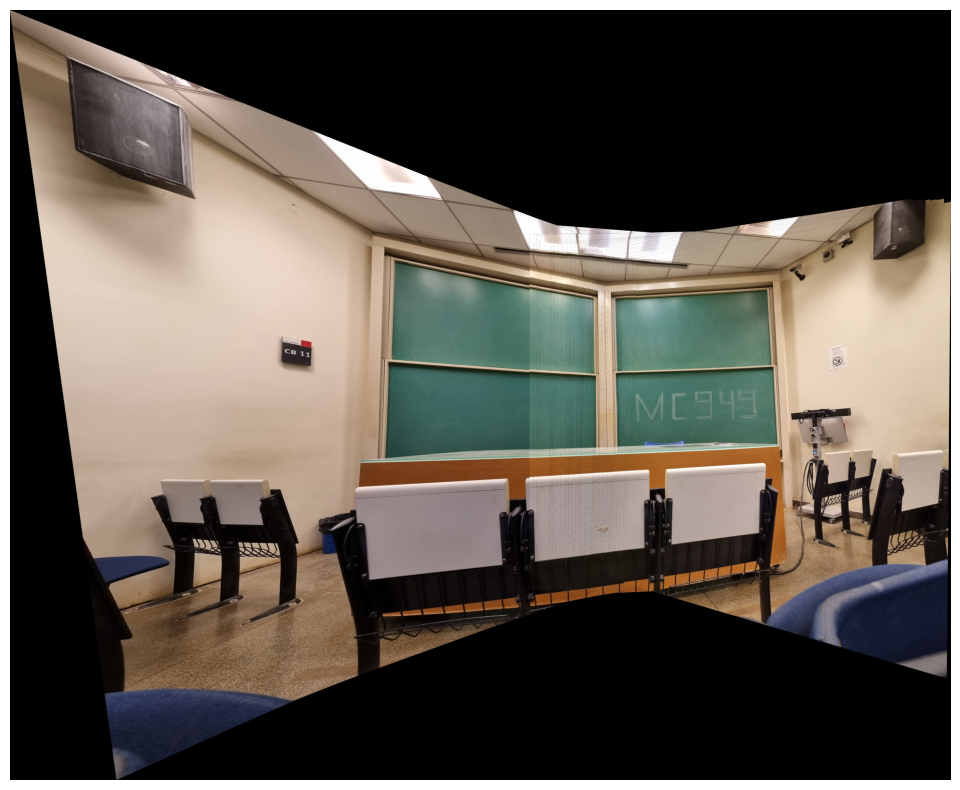


--- Blending: MULTIBAND ---


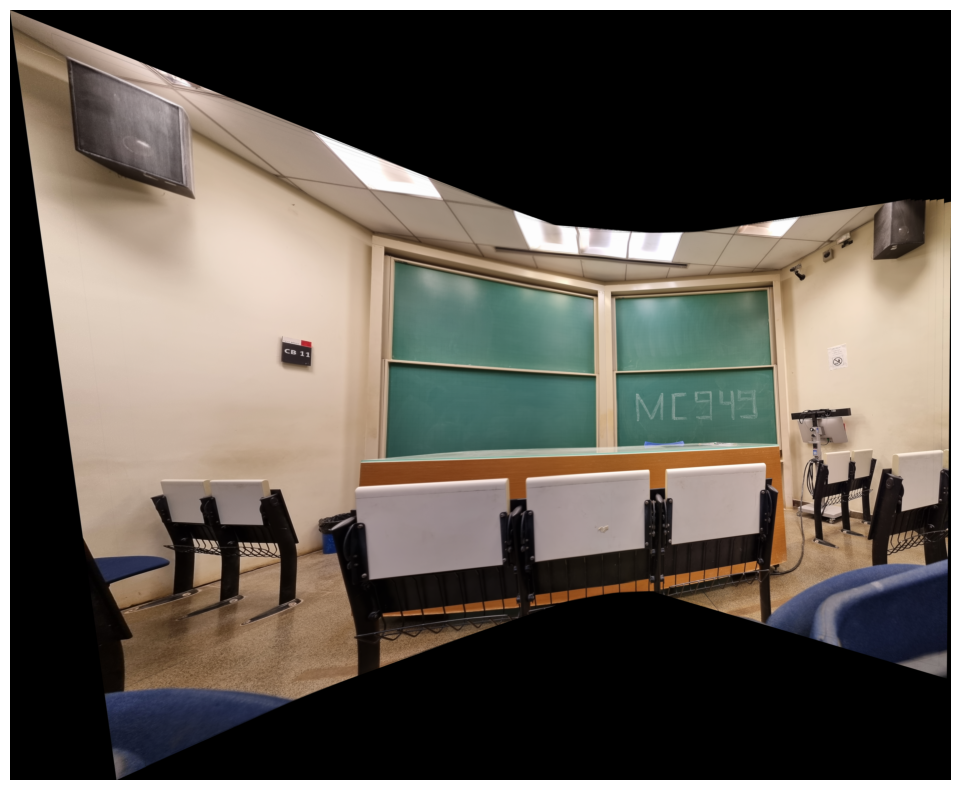


Composição e Blending para o conjunto: 'images-normal'

--- Detector: SIFT ---

--- Matcher: FLANN ---

--- Blending: SOBREPOSICAO_SIMPLES ---


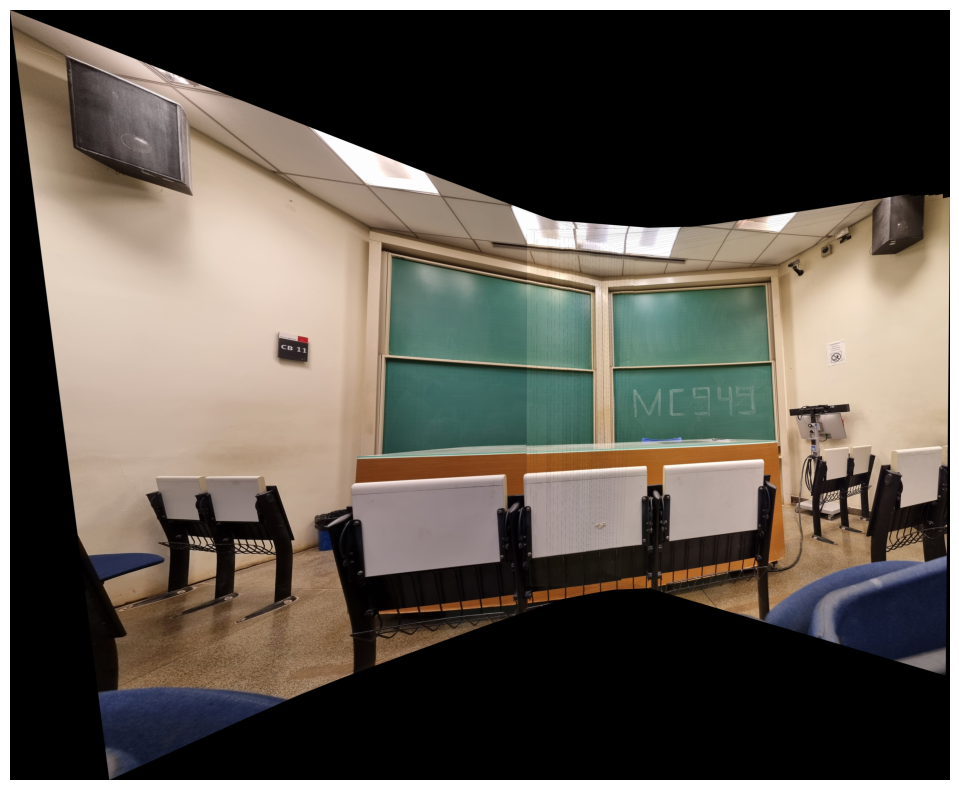


--- Blending: MULTIBAND ---


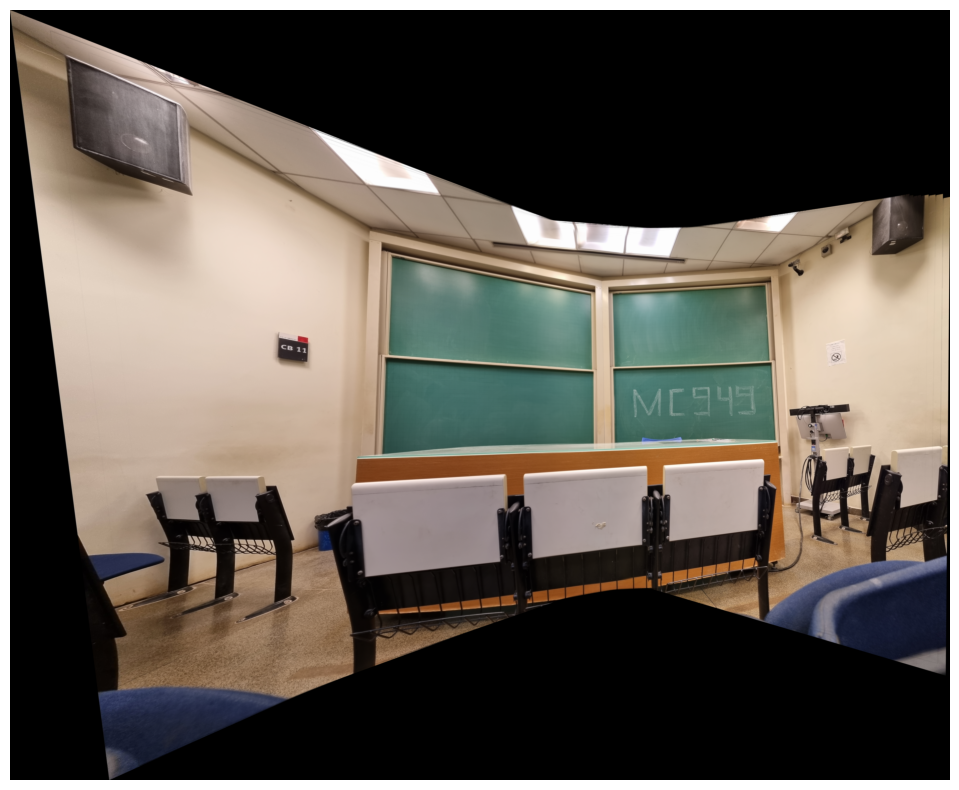


Composição e Blending para o conjunto: 'images-normal'

--- Detector: ORB ---

--- Matcher: BF ---

--- Blending: SOBREPOSICAO_SIMPLES ---


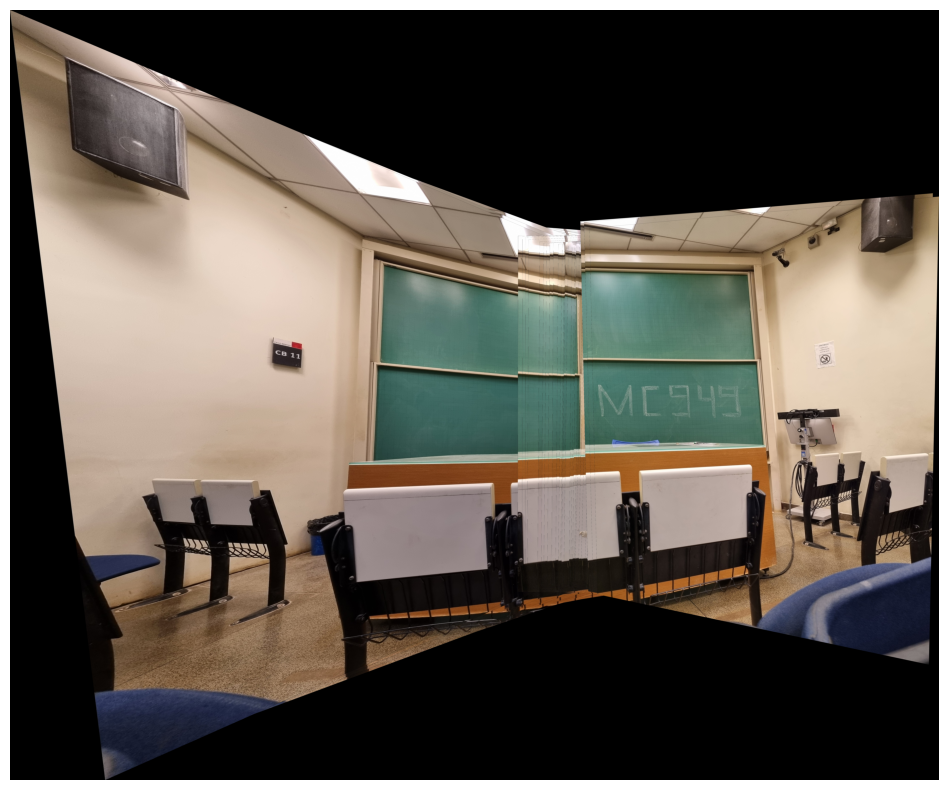


--- Blending: MULTIBAND ---


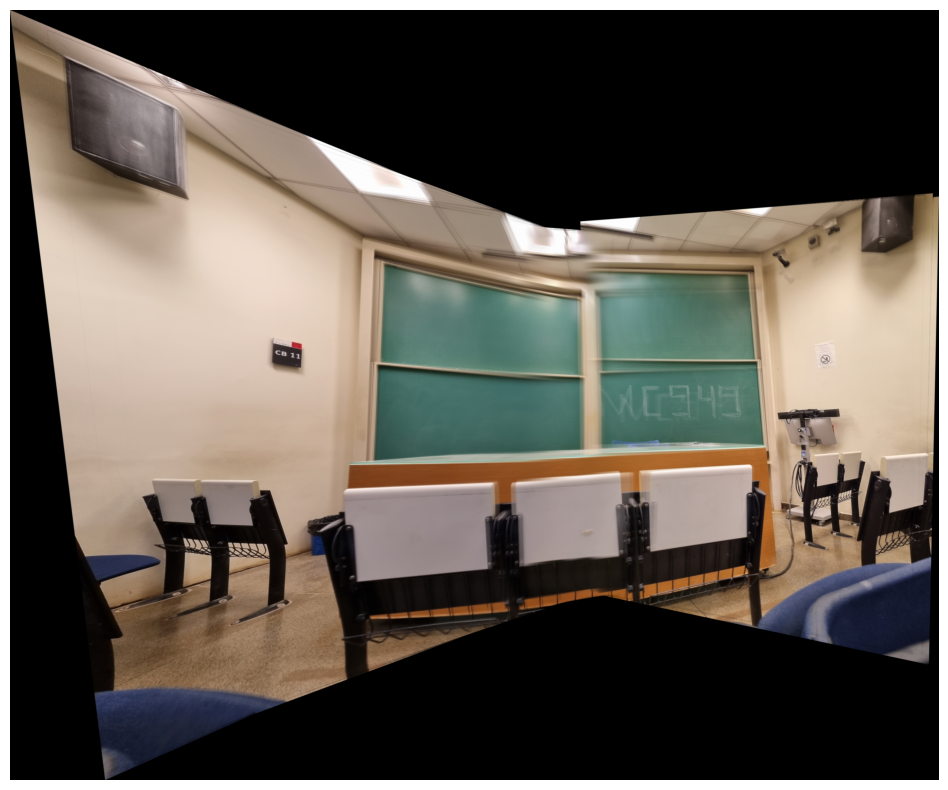


Composição e Blending para o conjunto: 'images-normal'

--- Detector: ORB ---

--- Matcher: FLANN ---

--- Blending: SOBREPOSICAO_SIMPLES ---


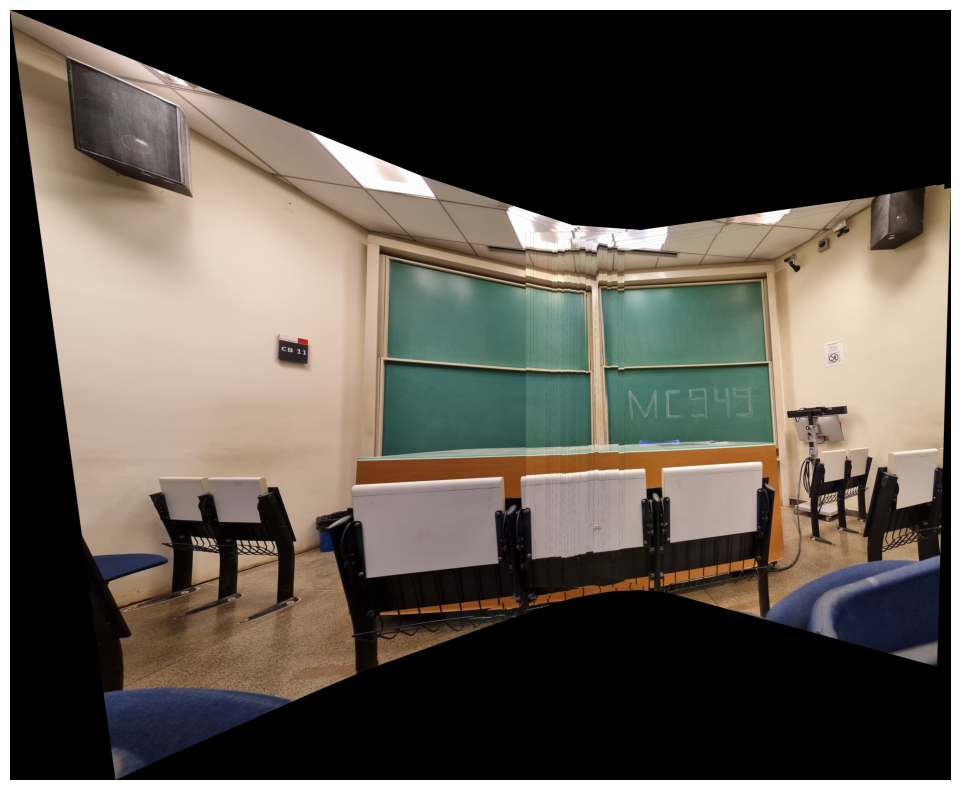


--- Blending: MULTIBAND ---


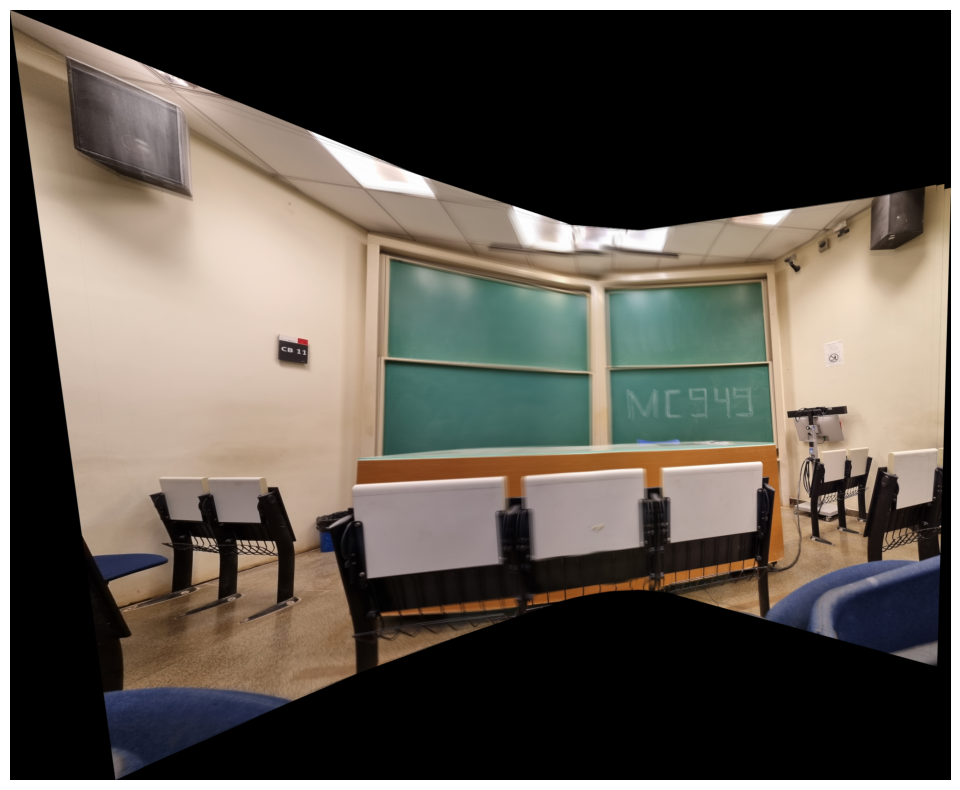


Composição e Blending para o conjunto: 'images-normal'

--- Detector: AKAZE ---

--- Matcher: BF ---

--- Blending: SOBREPOSICAO_SIMPLES ---


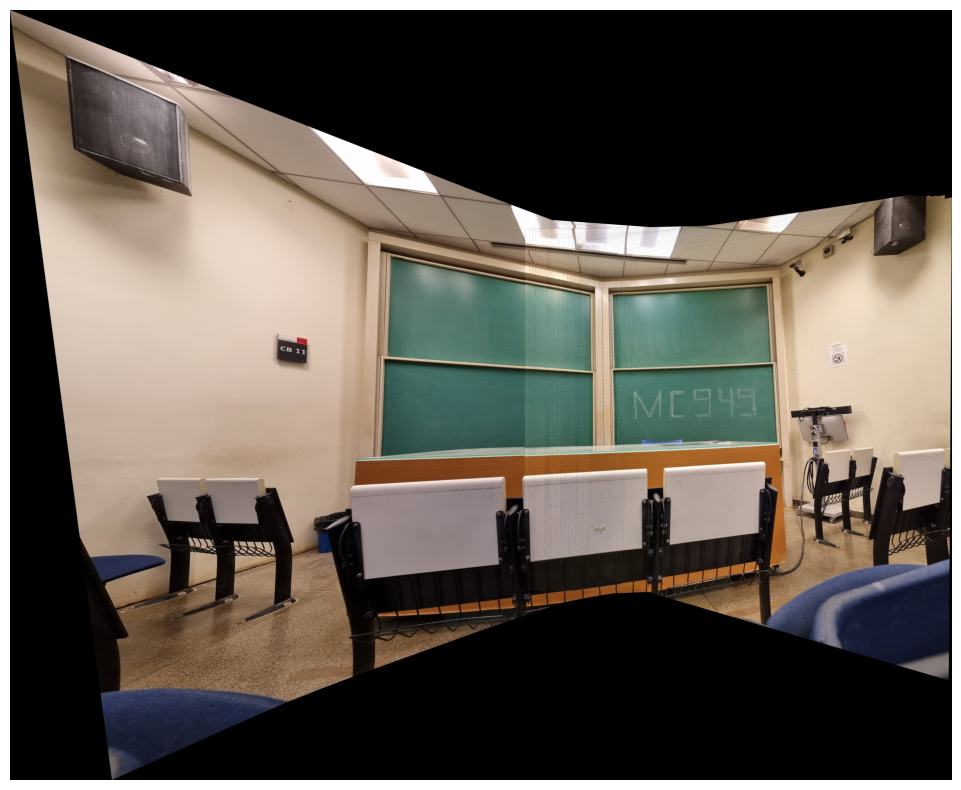


--- Blending: MULTIBAND ---


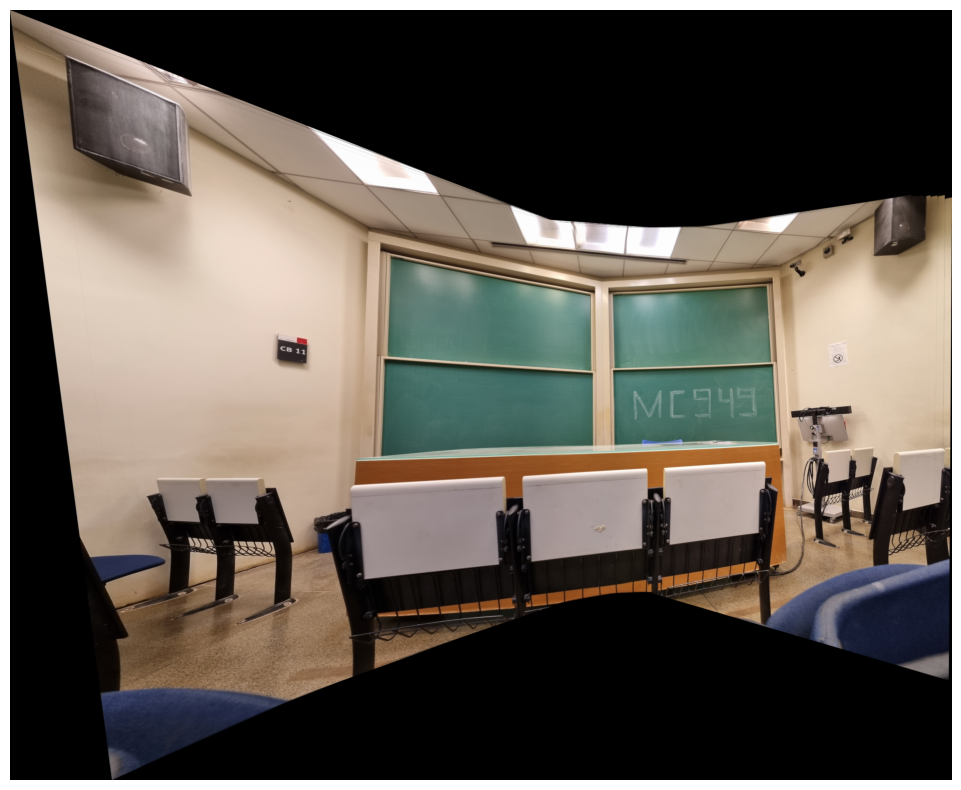


Composição e Blending para o conjunto: 'images-normal'

--- Detector: AKAZE ---

--- Matcher: FLANN ---

--- Blending: SOBREPOSICAO_SIMPLES ---


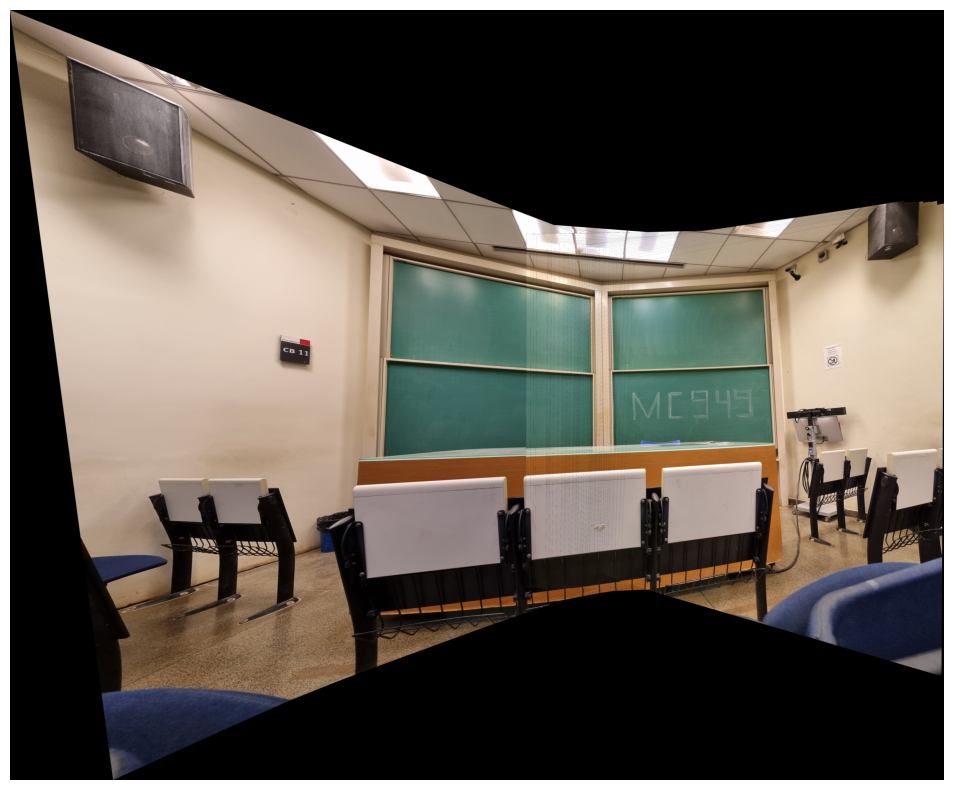


--- Blending: MULTIBAND ---


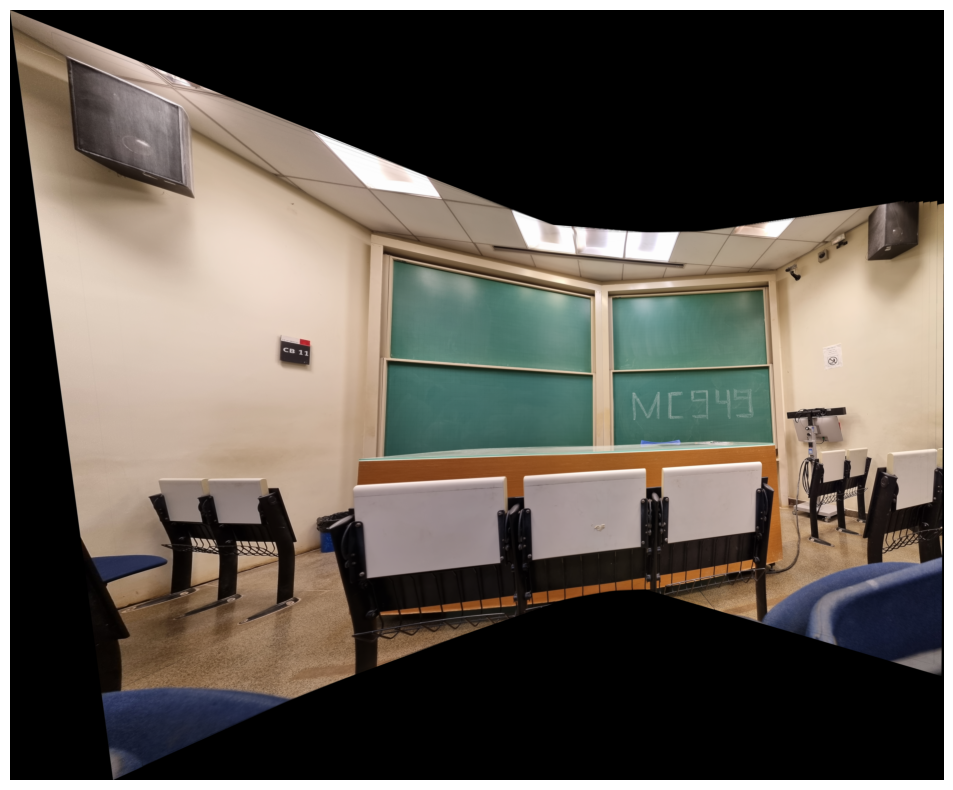


Composição e Blending para o conjunto: 'images-pro'

--- Detector: SIFT ---

--- Matcher: BF ---

--- Blending: SOBREPOSICAO_SIMPLES ---


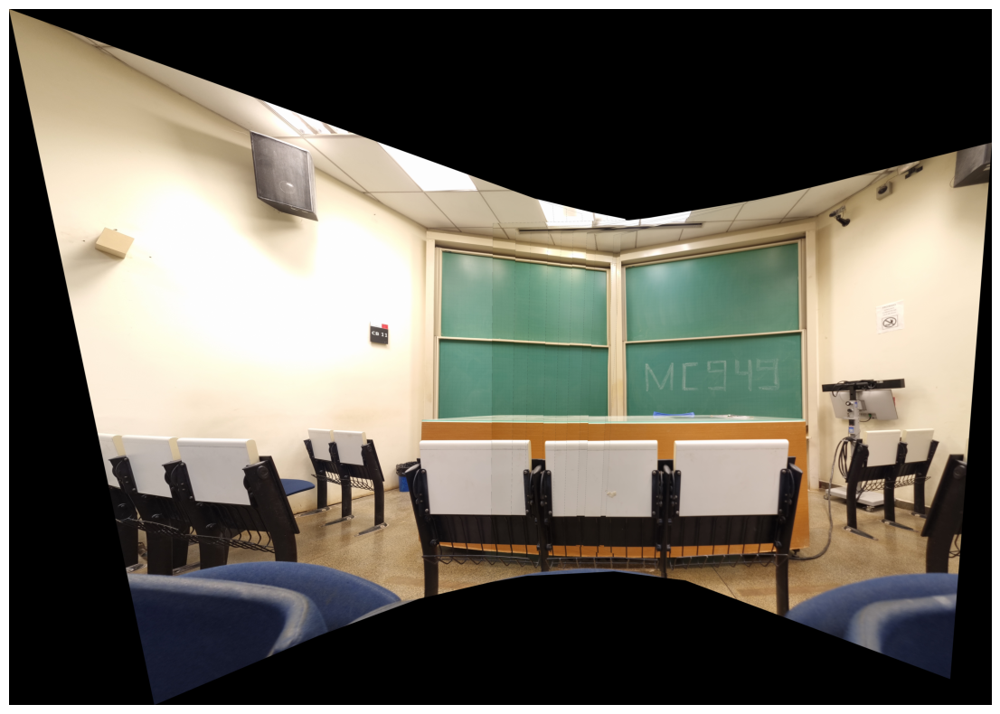


--- Blending: MULTIBAND ---


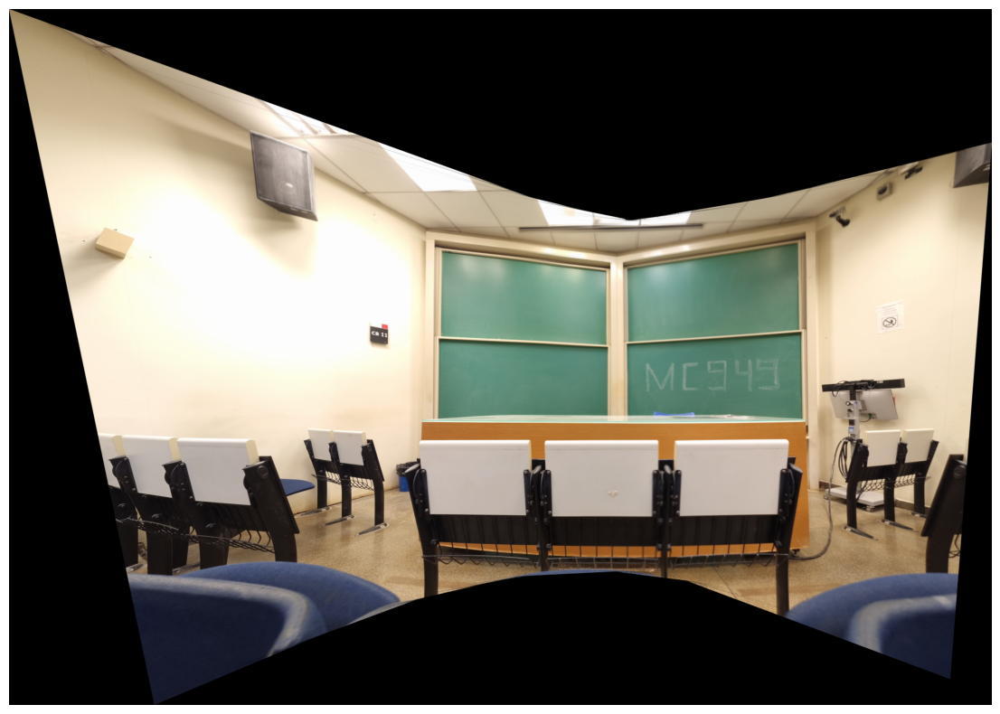


Composição e Blending para o conjunto: 'images-pro'

--- Detector: SIFT ---

--- Matcher: FLANN ---

--- Blending: SOBREPOSICAO_SIMPLES ---


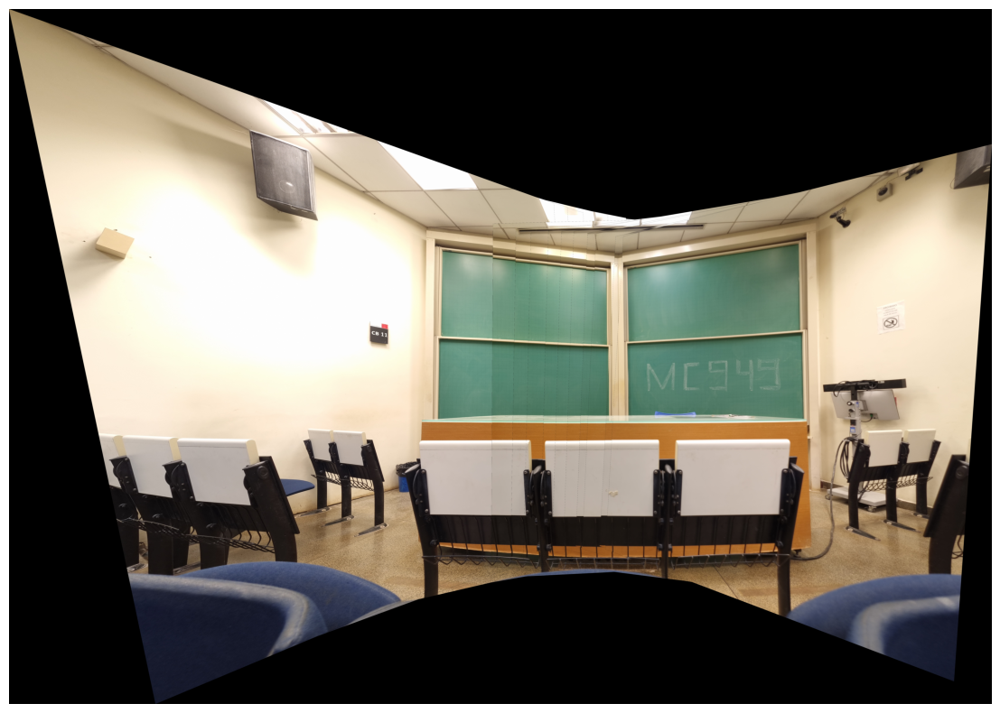


--- Blending: MULTIBAND ---


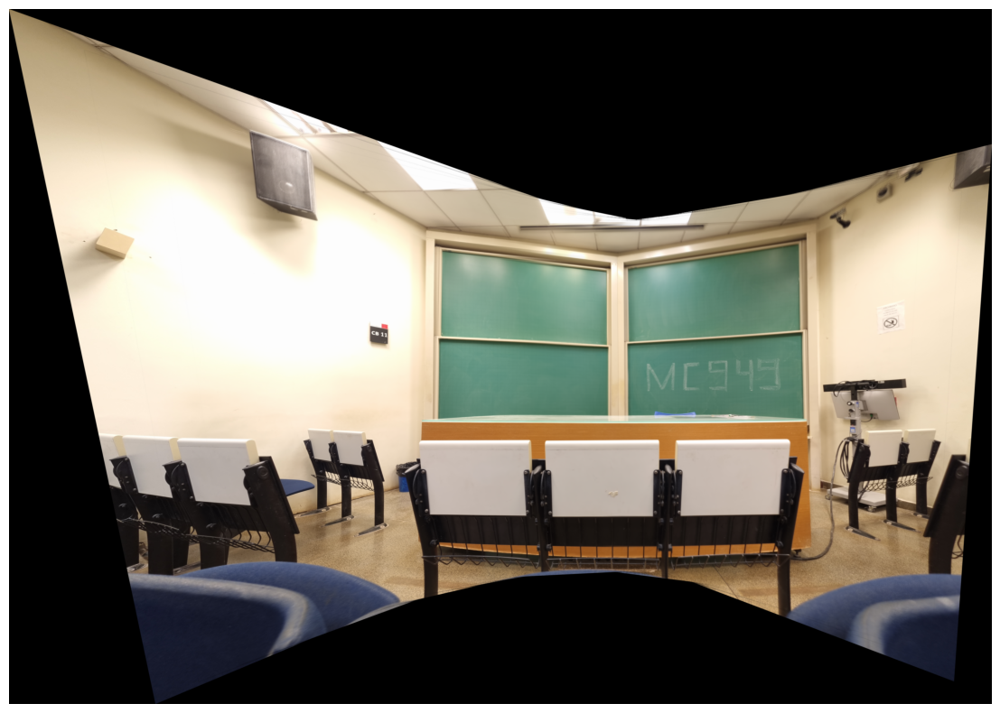


Composição e Blending para o conjunto: 'images-pro'

--- Detector: ORB ---

--- Matcher: BF ---

--- Blending: SOBREPOSICAO_SIMPLES ---


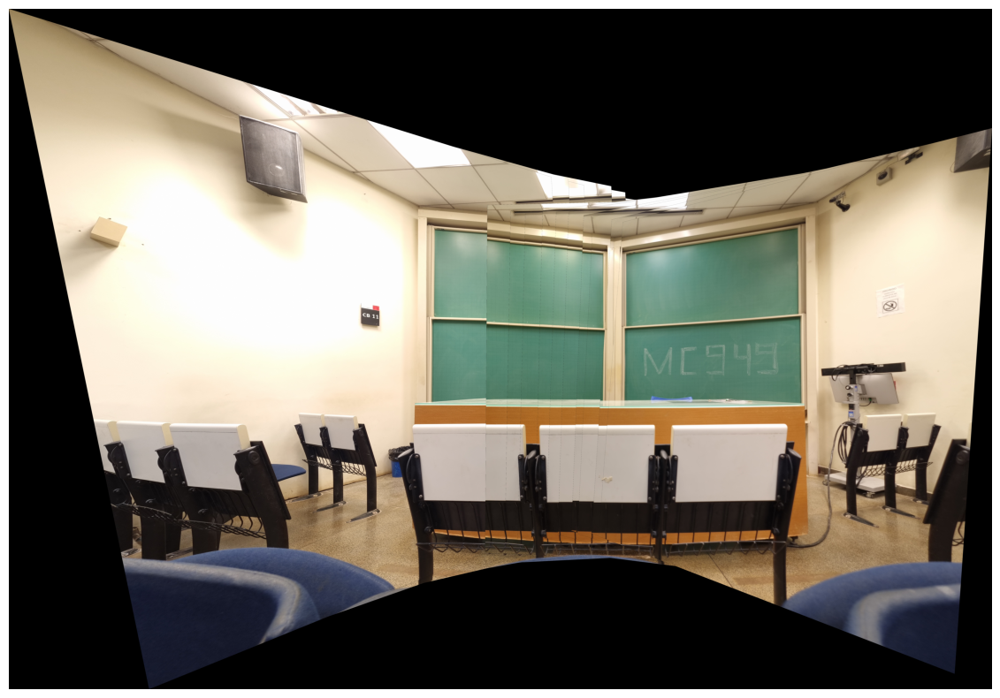


--- Blending: MULTIBAND ---


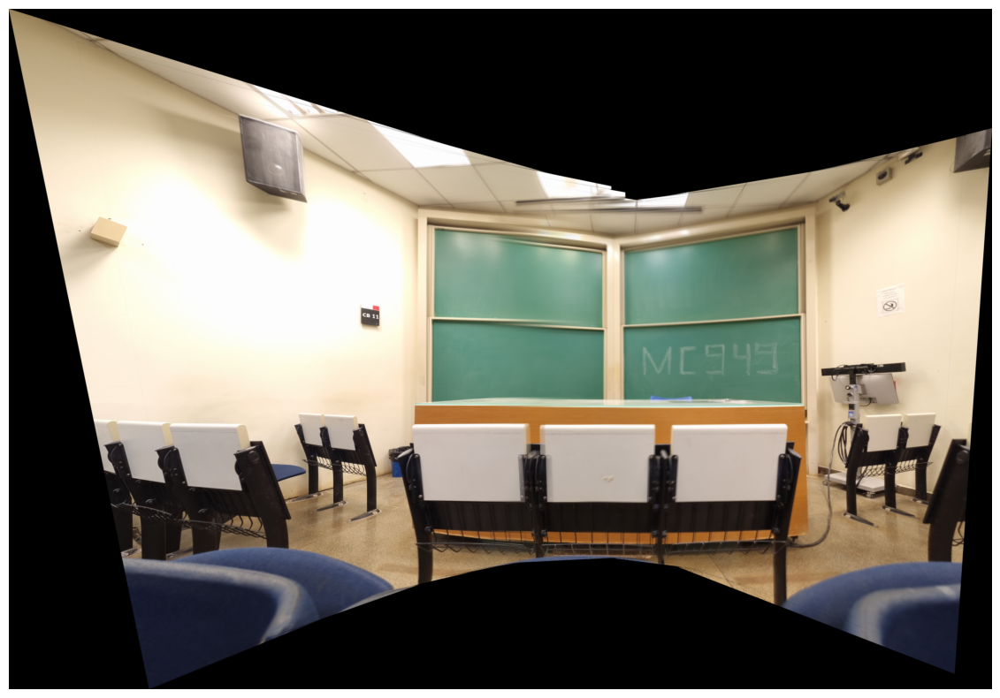


Composição e Blending para o conjunto: 'images-pro'

--- Detector: ORB ---

--- Matcher: FLANN ---

--- Blending: SOBREPOSICAO_SIMPLES ---


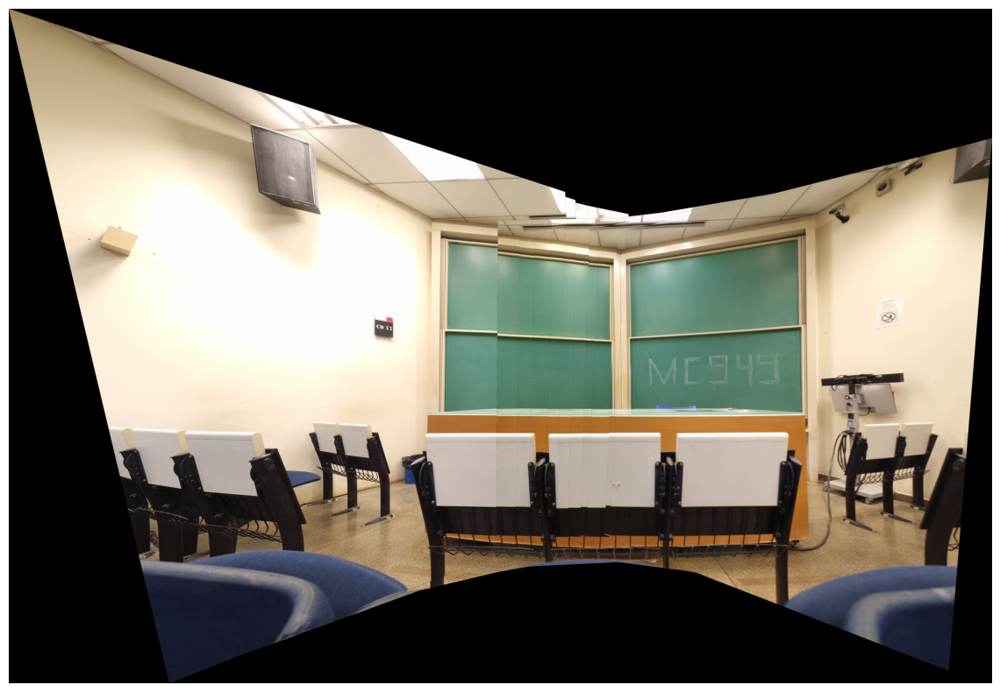


--- Blending: MULTIBAND ---


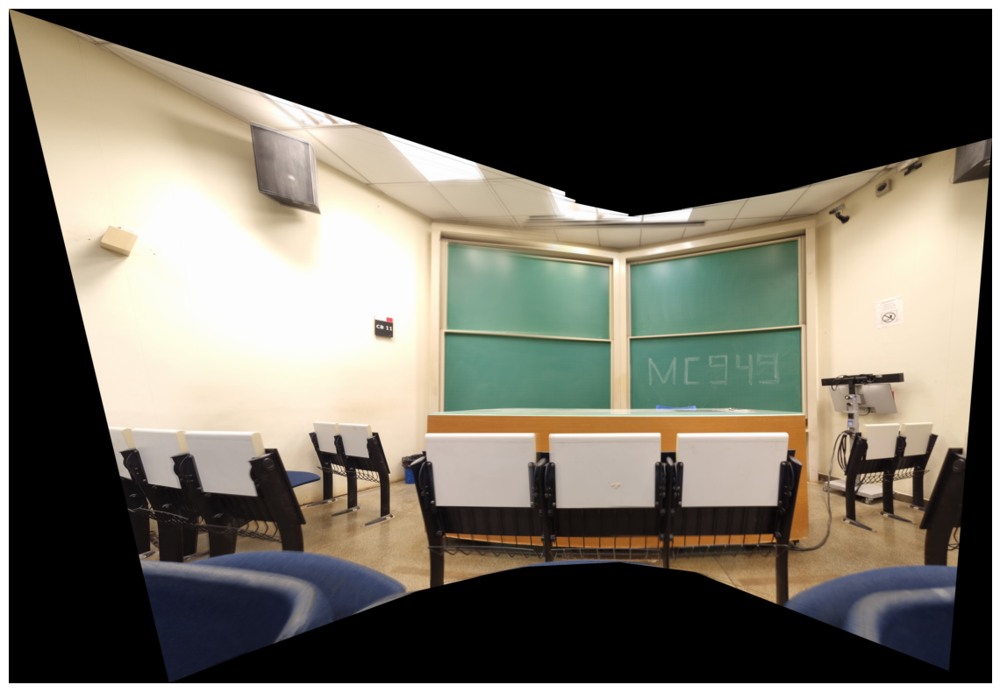


Composição e Blending para o conjunto: 'images-pro'

--- Detector: AKAZE ---

--- Matcher: BF ---

--- Blending: SOBREPOSICAO_SIMPLES ---


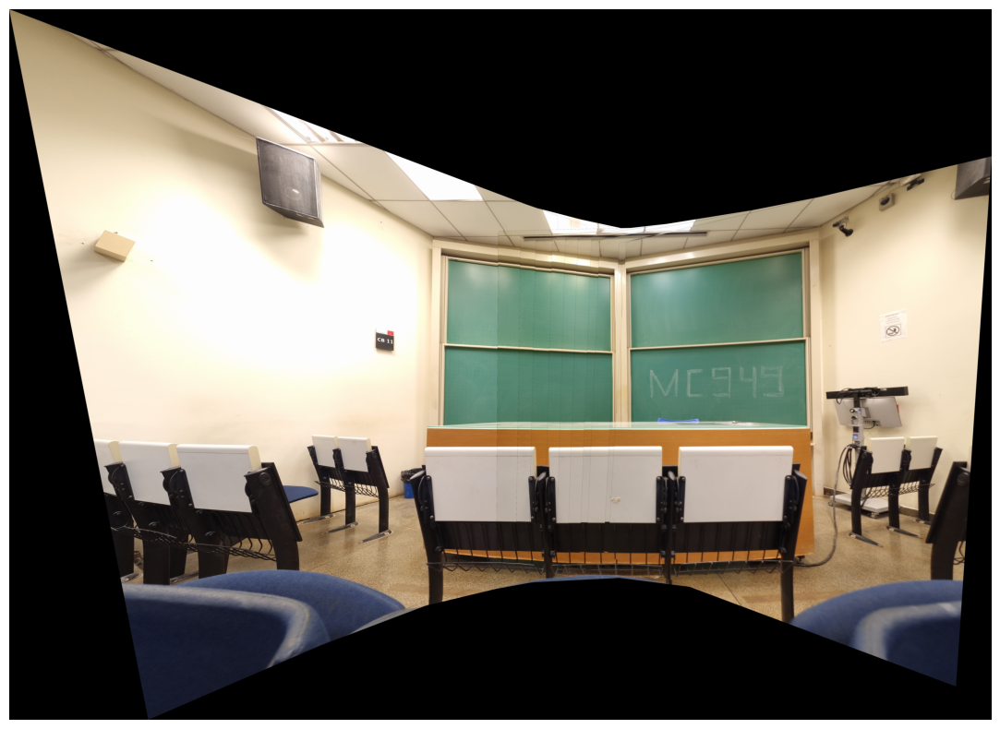


--- Blending: MULTIBAND ---


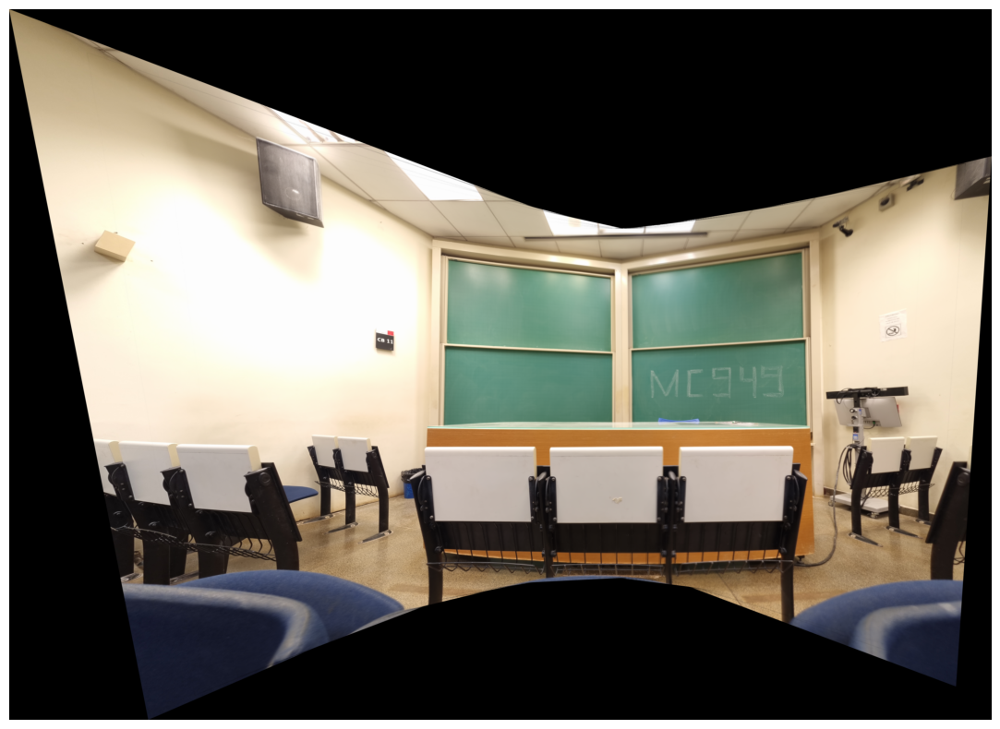


Composição e Blending para o conjunto: 'images-pro'

--- Detector: AKAZE ---

--- Matcher: FLANN ---

--- Blending: SOBREPOSICAO_SIMPLES ---


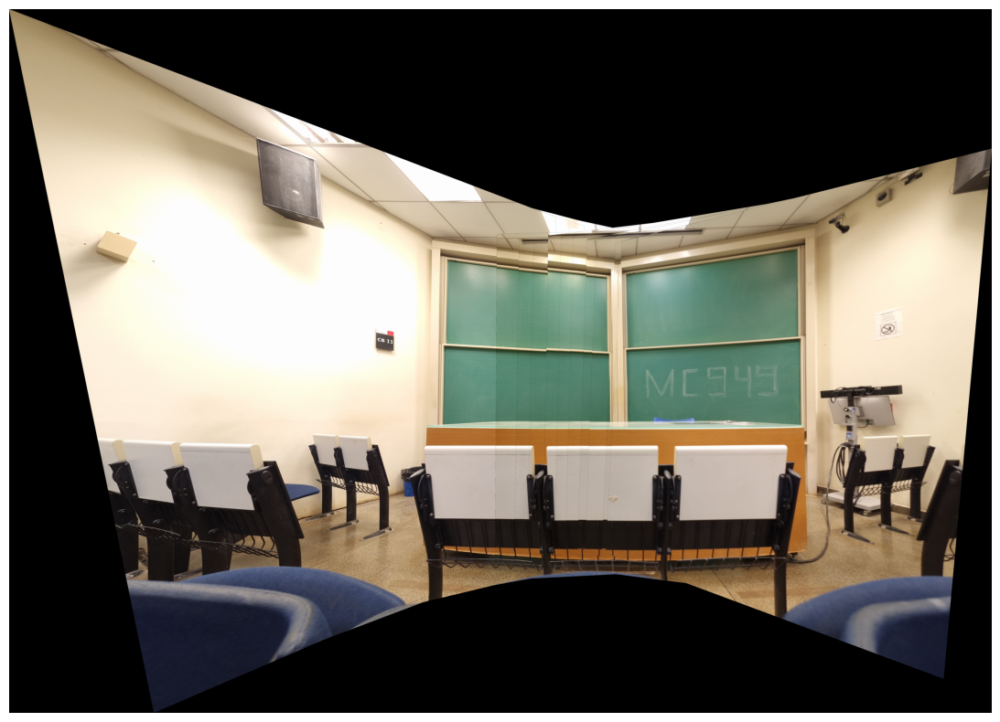


--- Blending: MULTIBAND ---


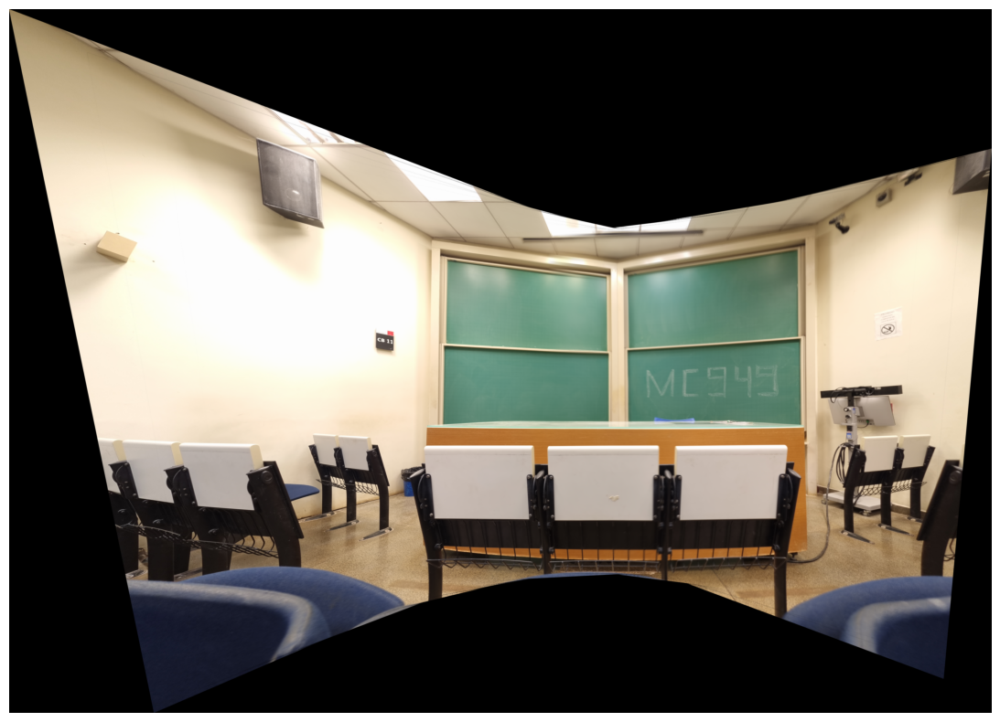

In [15]:
RAIZ_ETAPA2 = "resultados_etapa2"
RAIZ_ETAPA4 = "resultados_etapa4"
DETECTORS = ['sift', 'orb', 'akaze']
MATCHERS = ['bf', 'flann']
BLENDINGS = ['sobreposicao_simples', 'multiband']

RAIZ_ETAPA5 = "resultados_etapa5"

#conjuntos = [d for d in os.listdir(RAIZ_ETAPA2) if os.path.isdir(os.path.join(RAIZ_ETAPA2, d))]

conjuntos = [
 'images-normal',
 'images-pro']

for nome_conjunto in sorted(conjuntos):
    dir_saida = os.path.join(RAIZ_ETAPA5, nome_conjunto)
    os.makedirs(dir_saida, exist_ok=True)

    for nome_detector in DETECTORS:
        for nome_matcher in MATCHERS:
            caminho_homografias = os.path.join(RAIZ_ETAPA4, nome_conjunto, nome_detector, nome_matcher)
            caminho_ordem_imagens = os.path.join(RAIZ_ETAPA2, nome_conjunto, 'ordem_imagens.json')

            try:
                with open(caminho_ordem_imagens, "r") as f:
                    imagens_ordenadas = json.load(f)

            except FileNotFoundError:
                print(f"[Erro] '{caminho_json_ordem}' não encontrado. Abortando.")
                exit()

            homografias_pares = {}
            num_imagens = len(imagens_ordenadas)

            # Carregando arquivos de homografia salvos na etapa 4 para imagens ordenadas sequencialmente
            for i in range(num_imagens - 1):
                j = i + 1
                nome_arquivo_homografia = f"homogr_{i:03d}_{j:03d}.npz"
                caminho_completo = os.path.join(caminho_homografias, nome_arquivo_homografia)
                if os.path.exists(caminho_completo):
                    H, _, meta = carregar_homogr_npz(caminho_completo)
                    homografias_pares[(meta['idx_i'], meta['idx_j'])] = H

            print(f"\n{'='*65}\nComposição e Blending para o conjunto: '{nome_conjunto}'\n{'='*65}")
            print(f"\n--- Detector: {nome_detector.upper()} ---")
            print(f"\n--- Matcher: {nome_matcher.upper()} ---")
            
            for blend in BLENDINGS:
                print(f"\n--- Blending: {blend.upper()} ---")
                panorama = gerar_panorama(homografias_pares, imagens_ordenadas, BLENDING=blend)
                cv2.imwrite(os.path.join(dir_saida, f'{nome_conjunto}_{nome_detector}_{nome_matcher}_{blend}.png' ), panorama)

                plt.figure(figsize=(20, 10))
                plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
                plt.axis('off'); plt.show()


